# Problem Introduction and Motivation
# Introduction
Heart disease remains one of the leading causes of death worldwide, accounting for a significant portion of mortality rates across various demographics. Early detection and diagnosis of heart disease can save lives, reduce healthcare costs, and improve the quality of life for patients. To achieve this, medical professionals often rely on data-driven approaches to assist in diagnosing heart-related conditions. With the availability of patient data, machine learning models can help predict the likelihood of heart disease, providing valuable insights to healthcare providers.

# Problem Statement
The heart disease dataset provided contains various health metrics and demographic information about patients, along with a binary target variable that indicates the presence or absence of heart disease. The task is to build a machine learning model to predict whether a patient has heart disease based on the available features.

# Objective
The primary goal is to build a classification model that can accurately predict the likelihood of heart disease in patients. The model will analyze a set of predictor variables, such as age, sex, chest pain type, maximum heart rate, and exercise-induced angina, among others, to determine whether a patient is at risk of heart disease.

# Motivation
- Early prediction of heart disease can enable timely interventions, which are crucial for preventing adverse health outcomes and saving lives.
- Accurately diagnosing heart disease can reduce unnecessary tests and procedures, optimizing healthcare costs and improving resource allocation.
- A well-performing machine learning model can be deployed in various healthcare settings, ranging from large hospitals to local clinics, enabling broader access to predictive tools for heart disease.

# Bussiness Impact
Developing a reliable model to predict heart disease can offer significant benefits:
- By identifying at-risk patients early, healthcare providers can intervene and provide appropriate treatment, potentially reducing mortality rates.
- By leveraging data, we can move toward personalized medicine, where treatment and prevention strategies are tailored to individual patient profiles.
- Encouraging the use of machine learning models in healthcare promotes the adoption of data-driven approaches that could revolutionize how diseases are diagnosed and treated.

writing down the path of the dataset to import it

In [2]:
path='C:\\Users\\Gahan\\Downloads\\heart_disease.csv'

importing the required libraries

In [3]:
import pandas as pd
import numpy as np

# Data Collection
Loading the dataset and displaying it 

In [4]:
df = pd.read_csv(path)

In [5]:
df.head(10)

,heart_disease,age,sex,non_anginal_pain,max_heart_rate,exercise_induced_angina
0,0,69,1,0,131,0
1,0,69,0,0,151,0
2,0,66,0,0,114,0
3,1,65,1,0,174,0
4,0,64,1,0,144,1
5,0,64,1,0,155,0
6,0,63,1,0,150,0
7,1,61,1,0,145,0
8,0,60,0,0,171,0
9,0,59,1,0,145,0


# Data Exploration and Understanding
Displaying statistical summary of the dataset

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 297 entries, 0 to 296
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   heart_disease            297 non-null    int64
 1   age                      297 non-null    int64
 2   sex                      297 non-null    int64
 3   non_anginal_pain         297 non-null    int64
 4   max_heart_rate           297 non-null    int64
 5   exercise_induced_angina  297 non-null    int64
dtypes: int64(6)
memory usage: 14.1 KB


In [7]:
df.describe()

,heart_disease,age,sex,non_anginal_pain,max_heart_rate,exercise_induced_angina
count,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000
mean,0.461279,54.542088,0.676768,0.279461,149.599327,0.326599
std,0.499340,9.049736,0.468500,0.449492,22.941562,0.469761
min,0.000000,29.000000,0.000000,0.000000,71.000000,0.000000
25%,0.000000,48.000000,0.000000,0.000000,133.000000,0.000000
50%,0.000000,56.000000,1.000000,0.000000,153.000000,0.000000
75%,1.000000,61.000000,1.000000,1.000000,166.000000,1.000000
max,1.000000,77.000000,1.000000,1.000000,202.000000,1.000000


# Data Cleaning or Preprocessing
Performing data preprocessing steps. Here we used an feature engineering technique to fill the missing values of the data set with the median value so that it will help to maintain the distribution of data.

In [8]:
df.fillna(df.median(), inplace=True)

In [9]:
import seaborn as sns

# Feature Selection
Performing the correlation and visualizing it on a heat map. Here the correlation matrix helps us to understand the relationship betweeen numerical features in a dataset. From the below heat map we can see that the target variable heart_disease depends most on the exercise_induced_angina and then on the sex and then on the age which is followed by non_anginal_pain and at last it depends least on the max_heart_rate.

In [10]:
correlation_matrix = df.corr()

<Axes: >

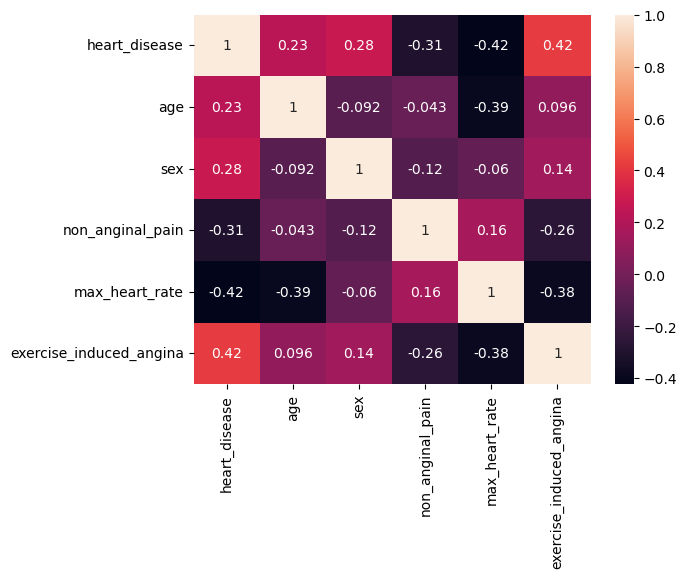

In [11]:
sns.heatmap(correlation_matrix, annot = True)

# Modelling
# Data splitting
Here we are performing the train test split and also dividing the target variable from the dataset in order to train the model.

In [12]:
from sklearn.model_selection import train_test_split
X = df.drop('heart_disease', axis = 1)
y = df['heart_disease']

In [13]:
X.head(10)

,age,sex,non_anginal_pain,max_heart_rate,exercise_induced_angina
0,69,1,0,131,0
1,69,0,0,151,0
2,66,0,0,114,0
3,65,1,0,174,0
4,64,1,0,144,1
5,64,1,0,155,0
6,63,1,0,150,0
7,61,1,0,145,0
8,60,0,0,171,0
9,59,1,0,145,0


In [14]:
y.head(10)

0    0
1    0
2    0
3    1
4    0
5    0
6    0
7    1
8    0
9    0
Name: heart_disease, dtype: int64

Here we are splitting the dataset into train and test. 80 percent of the data is given for training while 20 percent of the data is used for testing.

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=43)

In [16]:
X_train.head(5)

,age,sex,non_anginal_pain,max_heart_rate,exercise_induced_angina
76,68,1,1,150,1
93,60,1,1,155,0
262,51,1,0,173,1
47,52,1,0,158,0
10,59,1,0,159,0


In [17]:
y_train.head(5)

76     1
93     1
262    1
47     0
10     1
Name: heart_disease, dtype: int64

# Model Selection
Here the model selection is performed. we have selected the DecisionTreeClassifier model to perform the training and testing.

In [18]:
from sklearn.tree import DecisionTreeClassifier

Here we are using the DecisionTreeClassifier with the entroypy criterion. The entropy criterion helps to build the the decision trees focus on maximizing the purity of data.

In [19]:
model= DecisionTreeClassifier(criterion='entropy')

# Model Training

In [20]:
model.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy')

Here we are importing libraries to visualize the model.

In [21]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

Visualizing the decision tree model using the plot_tree function.

In [22]:
plt.figure(figsize=(512, 128))
plot_tree(model, filled=True, feature_names=X_train.columns, class_names=['No','Yes'], rounded=True)
plt.show()

# Model Evaluation
Here we are performing testing or prediction and evaluating the performance of the machine learning model on test dataset using the metrics accuracy score and classification report. The classification report helps us to understand how well the model performs on different classes.

In [37]:
from sklearn.metrics import accuracy_score, classification_report
y_pred = model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
accuracy = accuracy_score(y_test, y_pred)
print(classification_report(y_test, y_pred))


Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

           0       0.69      0.69      0.69        32
           1       0.64      0.64      0.64        28

    accuracy                           0.67        60
   macro avg       0.67      0.67      0.67        60
weighted avg       0.67      0.67      0.67        60



In [24]:
from sklearn import tree

text_representation = tree.export_text(model, feature_names=X_train.columns, max_depth=1)
print(text_representation)

|--- max_heart_rate <= 147.50
|   |--- exercise_induced_angina <= 0.50
|   |   |--- truncated branch of depth 12
|   |--- exercise_induced_angina >  0.50
|   |   |--- truncated branch of depth 9
|--- max_heart_rate >  147.50
|   |--- age <= 56.50
|   |   |--- truncated branch of depth 11
|   |--- age >  56.50
|   |   |--- truncated branch of depth 10



# Hyperparameter Tuning
we are using grid search to tune hyperparameters for optimal performance.

In [25]:
from sklearn.model_selection import GridSearchCV
param_grid = {'max_depth': [3, 5, 10], 'min_samples_split': [2, 5, 10]}
grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5)
grid_search.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [3, 5, 10],
                         'min_samples_split': [2, 5, 10]})

# Cross-Validation
We are performing cross-validation to validate the model’s robustness.

In [26]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")


Cross-validation scores: [0.72916667 0.6875     0.70212766 0.68085106 0.57446809]


# Model Interpretation
# Feature Importance
We are examining which features contribute most to the model’s decisions.

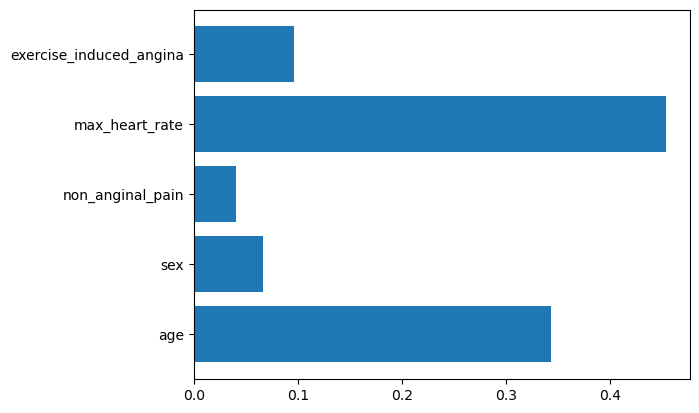

In [27]:
feature_importances = model.feature_importances_
plt.barh(X.columns, feature_importances)
plt.show()

# Model Explainability
We are using shap to interpret the predictions of the model at the instance level.

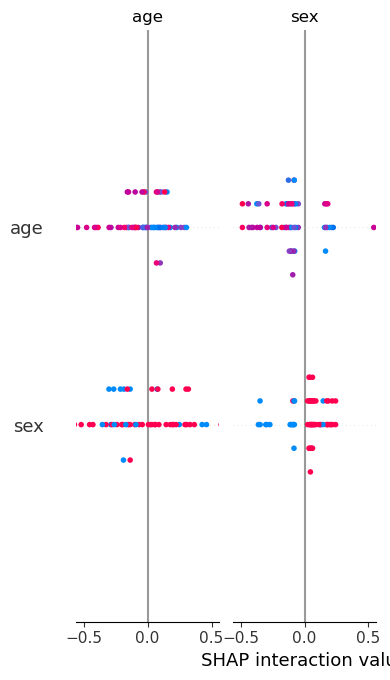

In [29]:
import shap
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

# Model Deployment
We are exporting the trained model to use in production.

In [30]:
import joblib
joblib.dump(model, 'decision_tree_model.pkl')


['decision_tree_model.pkl']

Here we are exporting the decision tree model using graphviz and visualizing it.

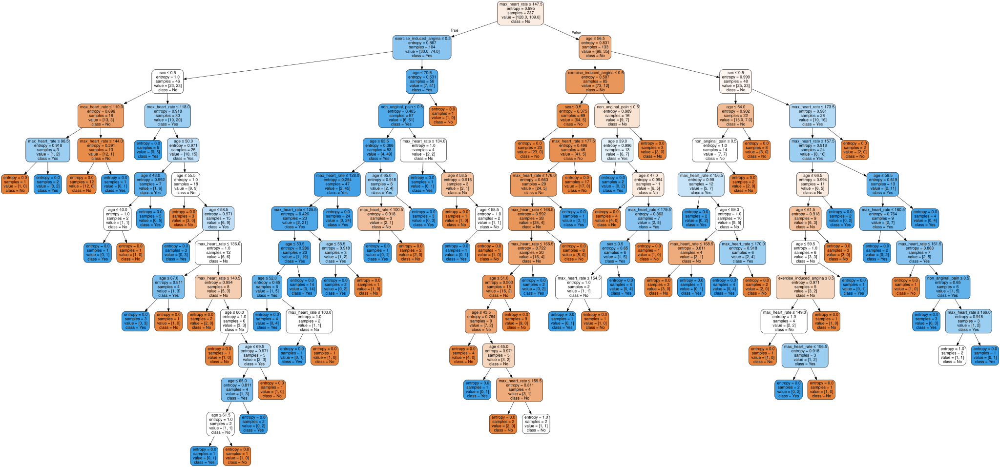

In [31]:
from sklearn.tree import export_graphviz
import graphviz
from IPython.display import display
dot_data = export_graphviz(model, 
                           out_file=None, 
                           feature_names=X_train.columns, 
                           class_names=['No', 'Yes'], 
                           filled=True, 
                           rounded=True, 
                           special_characters=True)
graph = graphviz.Source(dot_data)
display(graph)

We are deploying the model and creating a streamlit app interface with the data. Also, displaying the confusion matrix of the results.

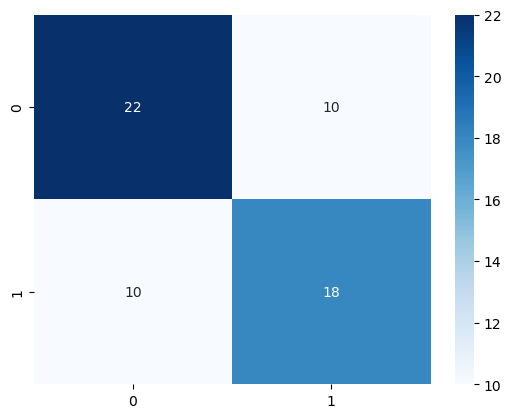

In [45]:
import streamlit as st
from sklearn.metrics import confusion_matrix

model = joblib.load('decision_tree_model.pkl')

# Creating the streamlit app
st.title("Heart Disease Prediction Results")
st.write(f"Model Accuracy: {accuracy * 100:.2f}%")

report = classification_report(y_test, y_pred, output_dict=True)
report_df = pd.DataFrame(report).transpose()
st.write("## Classification Report")
st.dataframe(report_df)

conf_matrix = confusion_matrix(y_test, y_pred)
st.write("## Confusion Matrix")
st.write(conf_matrix)

# Ploting the confusion matrix using Seaborn
st.write("## Confusion Matrix Visualization")
fig, ax = plt.subplots()
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", ax=ax)
st.pyplot(fig)

# Adding some explanation for the metrics
st.write("""
### Metrics Explanation:
- **Accuracy**: The proportion of correctly classified instances.
- **Precision**: The number of true positive predictions divided by the total number of positive predictions.
- **Recall**: The number of true positive predictions divided by the actual number of positive instances.
- **F1 Score**: The harmonic mean of precision and recall.
""")